# Workout & Fitness Tracker Data Analysis by Tushar Agarwal 23113153  
## Plan for the Analysis  
1. Set up the environment  
2. Load the dataset  
3. Data exploration & cleaning  
4. Univariate Analysis  
5. Multivariate Analysis  
6. Statistical Measures  
7. Visualizations (heatmaps, bar plots, scatter plots)  
8. Conclusions  


In [1]:
# Set up the environment
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('ggplot')
sns.set_palette('viridis')


In [2]:
#  Load the dataset
df = pd.read_csv('workout_fitness_tracker_data.csv')
df.head()


,User ID,Age,Gender,Height (cm),Weight (kg),Workout Type,Workout Duration (mins),Calories Burned,Heart Rate (bpm),Steps Taken,Distance (km),Workout Intensity,Sleep Hours,Water Intake (liters),Daily Calories Intake,Resting Heart Rate (bpm),VO2 Max,Body Fat (%),Mood Before Workout,Mood After Workout
0,1,39,Male,175,99,Cycling,79,384,112,8850,14.44,High,8.2,1.9,3195,61,38.4,28.5,Tired,Fatigued
1,2,36,Other,157,112,Cardio,73,612,168,2821,1.10,High,8.6,1.9,2541,73,38.4,28.5,Happy,Energized
2,3,25,Female,180,66,HIIT,27,540,133,18898,7.28,High,9.8,1.9,3362,80,38.4,28.5,Happy,Fatigued
3,4,56,Male,154,89,Cycling,39,672,118,14102,6.55,Medium,5.8,1.9,2071,65,38.4,28.5,Neutral,Neutral
4,5,53,Other,194,59,Strength,56,410,170,16518,3.17,Medium,7.3,1.9,3298,59,38.4,28.5,Stressed,Energized


In [3]:
df.columns

Index(['User ID', 'Age', 'Gender', 'Height (cm)', 'Weight (kg)',
       'Workout Type', 'Workout Duration (mins)', 'Calories Burned',
       'Heart Rate (bpm)', 'Steps Taken', 'Distance (km)', 'Workout Intensity',
       'Sleep Hours', 'Water Intake (liters)', 'Daily Calories Intake',
       'Resting Heart Rate (bpm)', 'VO2 Max', 'Body Fat (%)',
       'Mood Before Workout', 'Mood After Workout'],
      dtype='object')

In [4]:
#  Data exploration & cleaning
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')
df.info()
df.isnull().sum()
df.describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   user_id                 10000 non-null  int64  
 1   age                     10000 non-null  int64  
 2   gender                  10000 non-null  object 
 3   height_cm               10000 non-null  int64  
 4   weight_kg               10000 non-null  int64  
 5   workout_type            10000 non-null  object 
 6   workout_duration_mins   10000 non-null  int64  
 7   calories_burned         10000 non-null  int64  
 8   heart_rate_bpm          10000 non-null  int64  
 9   steps_taken             10000 non-null  int64  
 10  distance_km             10000 non-null  float64
 11  workout_intensity       10000 non-null  object 
 12  sleep_hours             10000 non-null  float64
 13  water_intake_liters     10000 non-null  float64
 14  daily_calories_intake   10000 non-null 

,user_id,age,height_cm,weight_kg,workout_duration_mins,calories_burned,heart_rate_bpm,steps_taken,distance_km,sleep_hours,water_intake_liters,daily_calories_intake,resting_heart_rate_bpm,vo2_max,body_fat_%
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,1.000000e+04,10000.0
mean,5000.50000,38.390100,174.275100,84.903000,64.464800,552.100800,129.526700,10455.496600,7.820745,6.982820,1.900000e+00,2748.428800,69.486500,3.840000e+01,28.5
std,2886.89568,12.171637,14.440986,20.189937,31.814946,260.629908,28.874152,5486.423716,4.159148,1.708738,2.109529e-14,717.109026,11.566763,4.590336e-12,0.0
min,1.00000,18.000000,150.000000,50.000000,10.000000,100.000000,80.000000,1000.000000,0.500000,4.000000,1.900000e+00,1500.000000,50.000000,3.840000e+01,28.5
25%,2500.75000,28.000000,162.000000,67.000000,37.000000,325.000000,105.000000,5673.000000,4.240000,5.500000,1.900000e+00,2124.000000,60.000000,3.840000e+01,28.5
50%,5000.50000,38.000000,174.000000,85.000000,64.000000,554.000000,130.000000,10434.500000,7.850000,7.000000,1.900000e+00,2753.000000,69.000000,3.840000e+01,28.5
75%,7500.25000,49.000000,187.000000,102.000000,92.000000,776.000000,155.000000,15211.000000,11.410000,8.400000,1.900000e+00,3360.000000,80.000000,3.840000e+01,28.5
max,10000.00000,59.000000,199.000000,119.000000,119.000000,999.000000,179.000000,19998.000000,15.000000,10.000000,1.900000e+00,3999.000000,89.000000,3.840000e+01,28.5


C:\Users\sures\miniconda3\envs\ds_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


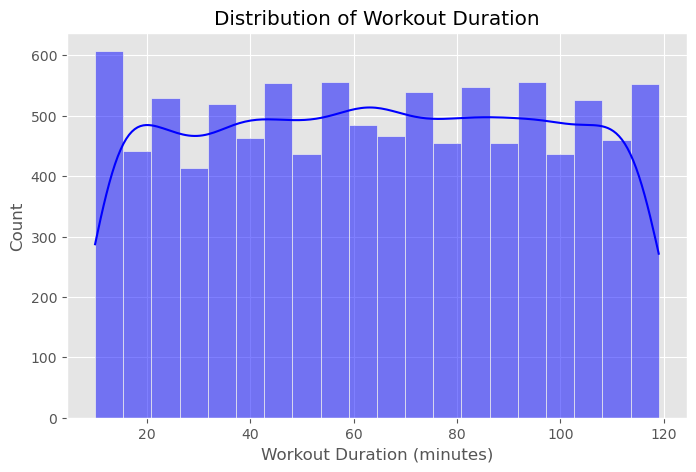

In [5]:
# Univariate Analysis  
# Distribution of Workout Duration
plt.figure(figsize=(8, 5))
sns.histplot(df['workout_duration_mins'], bins=20, kde=True, color='blue')
plt.title('Distribution of Workout Duration')
plt.xlabel('Workout Duration (minutes)')
plt.show()


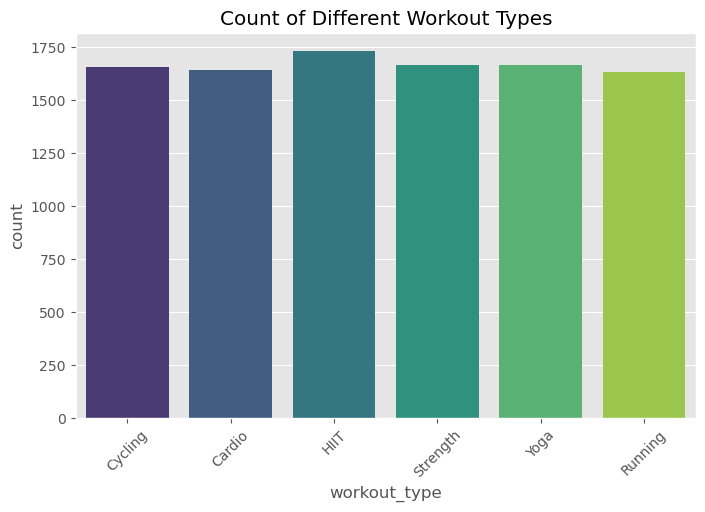

In [6]:
# Count of Workout Types
plt.figure(figsize=(8, 5))
sns.countplot(x='workout_type', data=df)
plt.title('Count of Different Workout Types')
plt.xticks(rotation=45)
plt.show()


C:\Users\sures\miniconda3\envs\ds_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


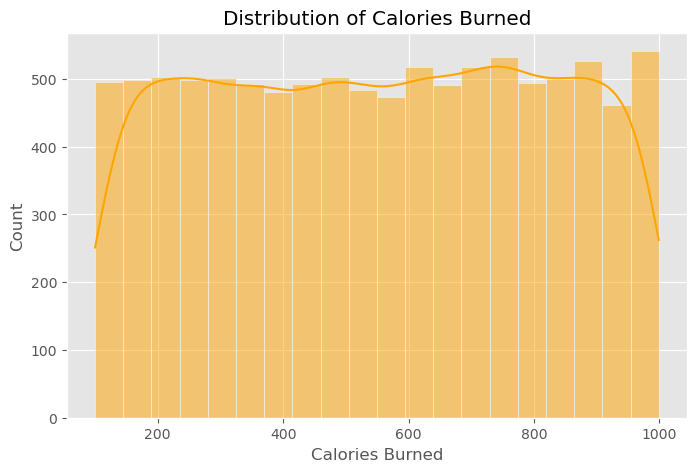

In [7]:
# Distribution of Calories Burned
plt.figure(figsize=(8, 5))
sns.histplot(df['calories_burned'], bins=20, kde=True, color='orange')
plt.title('Distribution of Calories Burned')
plt.xlabel('Calories Burned')
plt.show()


C:\Users\sures\miniconda3\envs\ds_env\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


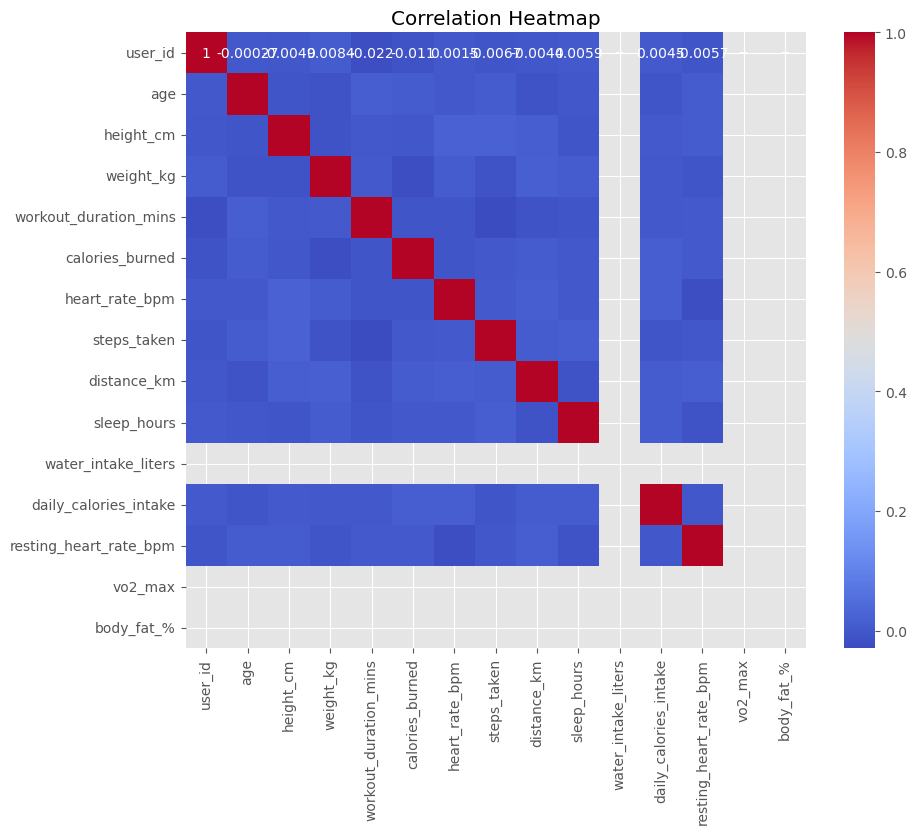

In [8]:
# Multivariate Analysis  
# Correlation Heatmap
numerical_df = df.select_dtypes(include='number')

plt.figure(figsize=(10, 8))
sns.heatmap(numerical_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


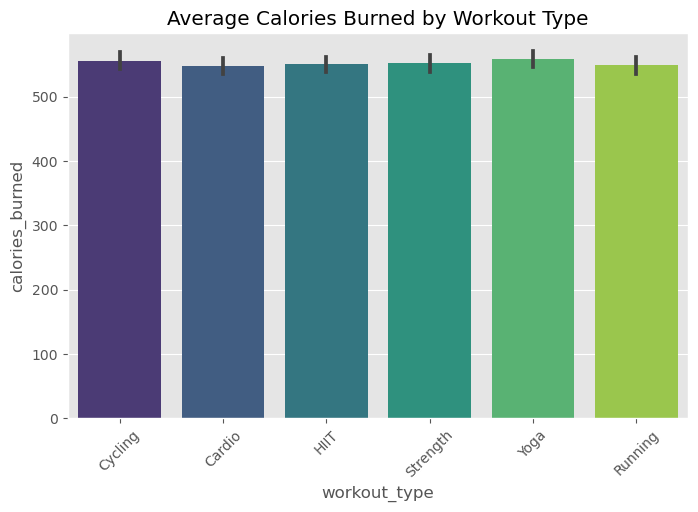

In [9]:
# Average Calories Burned by Workout Type
plt.figure(figsize=(8, 5))
sns.barplot(x='workout_type', y='calories_burned', data=df)
plt.title('Average Calories Burned by Workout Type')
plt.xticks(rotation=45)
plt.show()


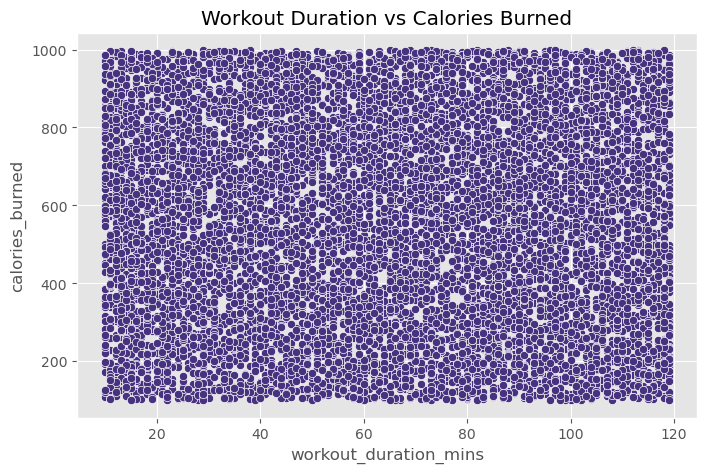

In [10]:
# Workout Duration vs Calories Burned
plt.figure(figsize=(8, 5))
sns.scatterplot(x='workout_duration_mins', y='calories_burned', data=df)
plt.title('Workout Duration vs Calories Burned')
plt.show()


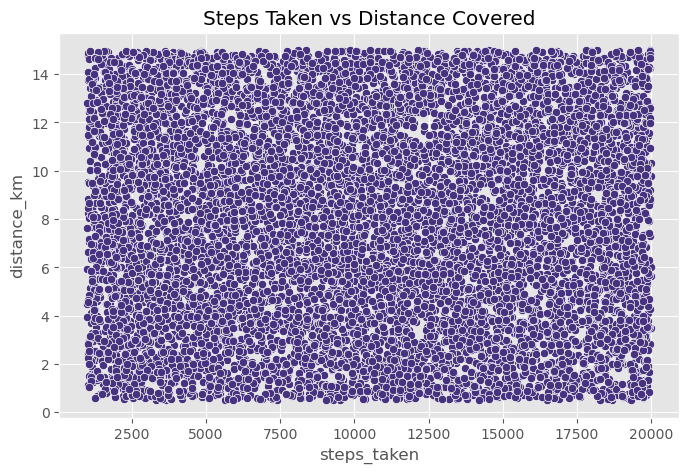

In [11]:
# Steps Taken vs Distance Covered
plt.figure(figsize=(8, 5))
sns.scatterplot(x='steps_taken', y='distance_km', data=df)
plt.title('Steps Taken vs Distance Covered')
plt.show()


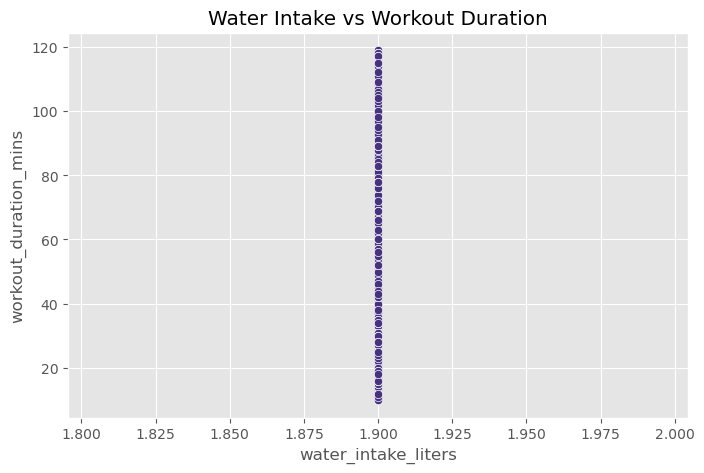

In [12]:
# Water Intake vs Workout Duration
plt.figure(figsize=(8, 5))
sns.scatterplot(x='water_intake_liters', y='workout_duration_mins', data=df)
plt.title('Water Intake vs Workout Duration')
plt.show()


In [13]:
## 6. Statistical Measures  
duration_mean = df['workout_duration_mins'].mean()
duration_median = df['workout_duration_mins'].median()
duration_mode = df['workout_duration_mins'].mode()[0]

print(f"Mean Workout Duration: {duration_mean} minutes")
print(f"Median Workout Duration: {duration_median} minutes")
print(f"Mode Workout Duration: {duration_mode} minutes")


Mean Workout Duration: 64.4648 minutes
Median Workout Duration: 64.0 minutes
Mode Workout Duration: 15 minutes


In [14]:
calories_mean = df['calories_burned'].mean()
calories_median = df['calories_burned'].median()
calories_mode = df['calories_burned'].mode()[0]

print(f"Mean Calories Burned: {calories_mean}")
print(f"Median Calories Burned: {calories_median}")
print(f"Mode Calories Burned: {calories_mode}")


Mean Calories Burned: 552.1008
Median Calories Burned: 554.0
Mode Calories Burned: 504


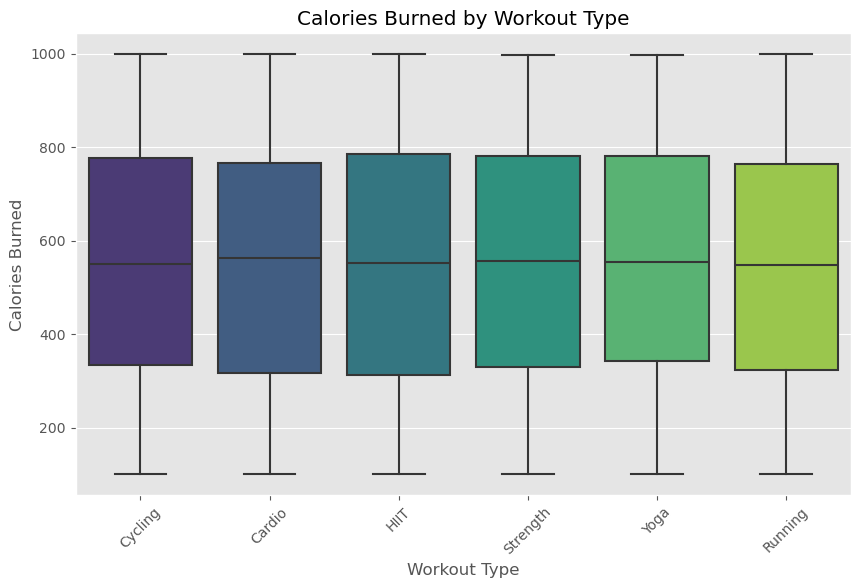

In [15]:
# Calories Burned by Workout Type
plt.figure(figsize=(10, 6))
sns.boxplot(x='workout_type', y='calories_burned', data=df, palette='viridis')
plt.title('Calories Burned by Workout Type')
plt.xlabel('Workout Type')
plt.ylabel('Calories Burned')
plt.xticks(rotation=45)
plt.show()



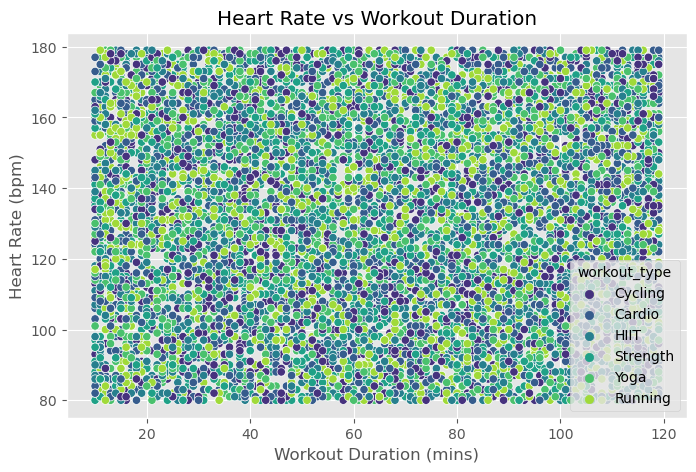

In [16]:
#  Heart Rate vs Workout Duration
plt.figure(figsize=(8, 5))
sns.scatterplot(x='workout_duration_mins', y='heart_rate_bpm', data=df, hue='workout_type', palette='viridis')
plt.title('Heart Rate vs Workout Duration')
plt.xlabel('Workout Duration (mins)')
plt.ylabel('Heart Rate (bpm)')
plt.show()


C:\Users\sures\miniconda3\envs\ds_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sures\miniconda3\envs\ds_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sures\miniconda3\envs\ds_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sures\miniconda3\envs\ds_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future

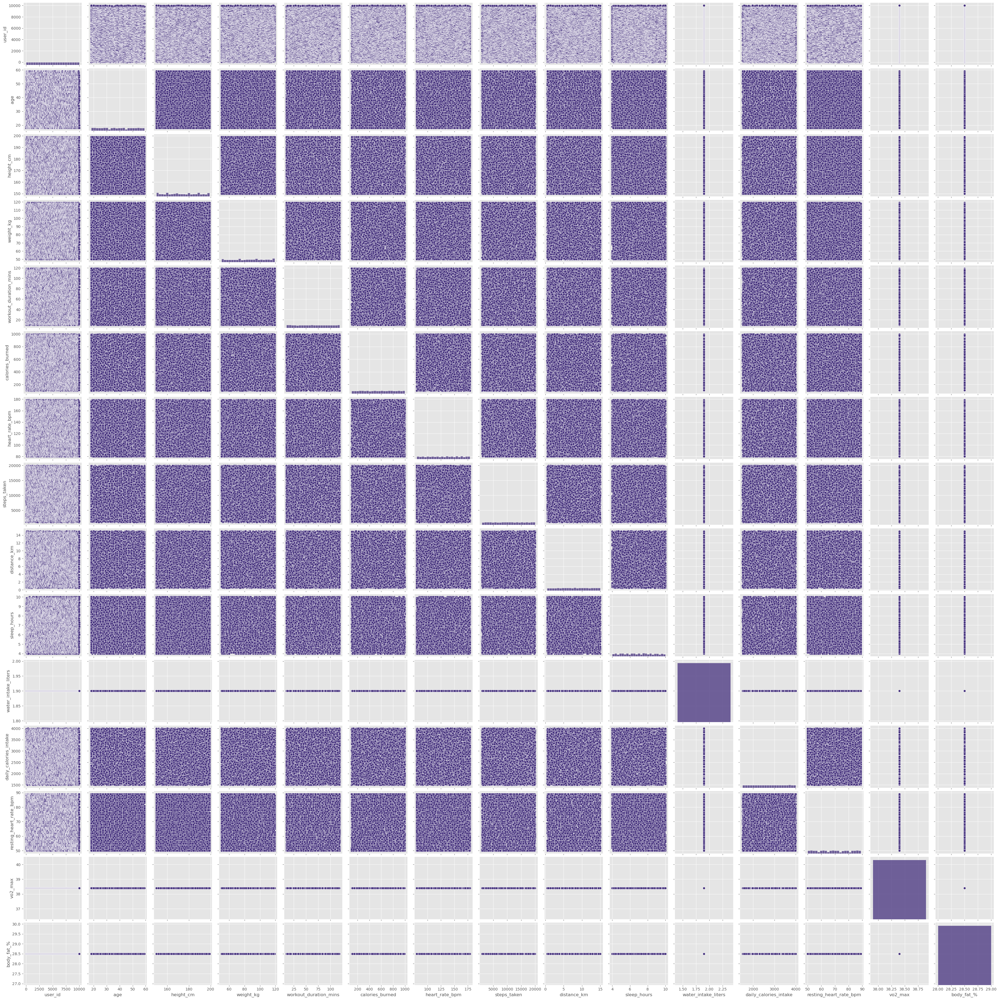

In [17]:
# Pair Plot for Numerical Variables
sns.pairplot(numerical_df)
plt.show()


## 8. Conclusions  
- Cardio and HIIT workouts tend to burn more calories compared to yoga and strength training.  
- Longer workout durations generally lead to more calories burned and higher heart rates.  
- Steps taken and distance covered show a strong positive correlation.  
- Higher water intake is often associated with longer and more intense workouts.  
- The heatmap highlights key relationships between workout duration, calories burned, heart rate, and fitness metrics.  
